In [1]:
import os, sys, inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir)

%matplotlib inline
from nuscenes.nuscenes import NuScenes
from util.depth_map_utils import *
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle as pkl
import util.opt as opt
import os
import cv2
from pyquaternion import Quaternion
from util.inverse_warp import *
from util.image import *
from util.io import *
from util.data import *

import torch
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from network.net import PConvUNet, VGG16FeatureExtractor, NLayerDiscriminator

In [2]:
batch_size = 8
n_threads = 4

dataset = NusceneDataset('../dataset (copy)/', train=False, random_mask=False)
iterator = iter(data.DataLoader(
    dataset,
    batch_size=batch_size,
    sampler=InfiniteSampler(len(dataset)),
    num_workers=n_threads
))

# load model
alphas = [0.50, 0.75, 1.00]
models = []

for alpha in alphas:
    modelG = PConvUNet()
    modelG.eval()
    start_iter = load_ckpt(
        "../snapshots_GAN/alpha_%.2f/1000000.pth" % (alpha), [('model', modelG)],
        None
    )
    models.append(modelG)

In [3]:
def show(img, size=10):
    npimg = img.numpy()
    num_cols = len(alphas) + 2
    plt.figure(figsize=(batch_size * size, 2 * size * num_cols))
    plt.imshow(np.transpose(npimg, (1, 2, 0)), interpolation='nearest')

In [4]:
def test():    
    # extract sample
    sample = next(iterator)
    gt, img, depth, mask = sample['gt'], sample['img'], sample['depth'], sample['mask']
    intrinsic, extrinsic = sample['intrinsic'], sample['extrinsic']
    
    # convert to doubles
    depth = depth.double()
    intrinsic = intrinsic.double()
    extrinsic = extrinsic.double()
    
    mask = mask.float()
    projected_img = normalize(unnormalize(img.float()) * mask)    
    outputs = []
    
    # run image through model
    with torch.no_grad():
        for modelG in models:
            output, _ = modelG(projected_img, mask)
            
            output = mask * projected_img.float() + (1 - mask) * output
            output = unnormalize(output)
            outputs.append(output)
    
    outputs = torch.cat(outputs, dim=3)
    projected_img = unnormalize(projected_img.float())
    gt = unnormalize(gt.float())
    
    # concatenate input, output, gt
    results = torch.cat([projected_img.double(), outputs.double(), gt.double()], dim=3)
    
    # plot image
    show(make_grid(results, nrow=1))

$\alpha = [0., 0.25, 0.50, 0.75, 1.00]$

From left to right: input image, $(1 - \alpha) \times L_{GAN} + \alpha \times L_{RECONST}$, ground truth

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


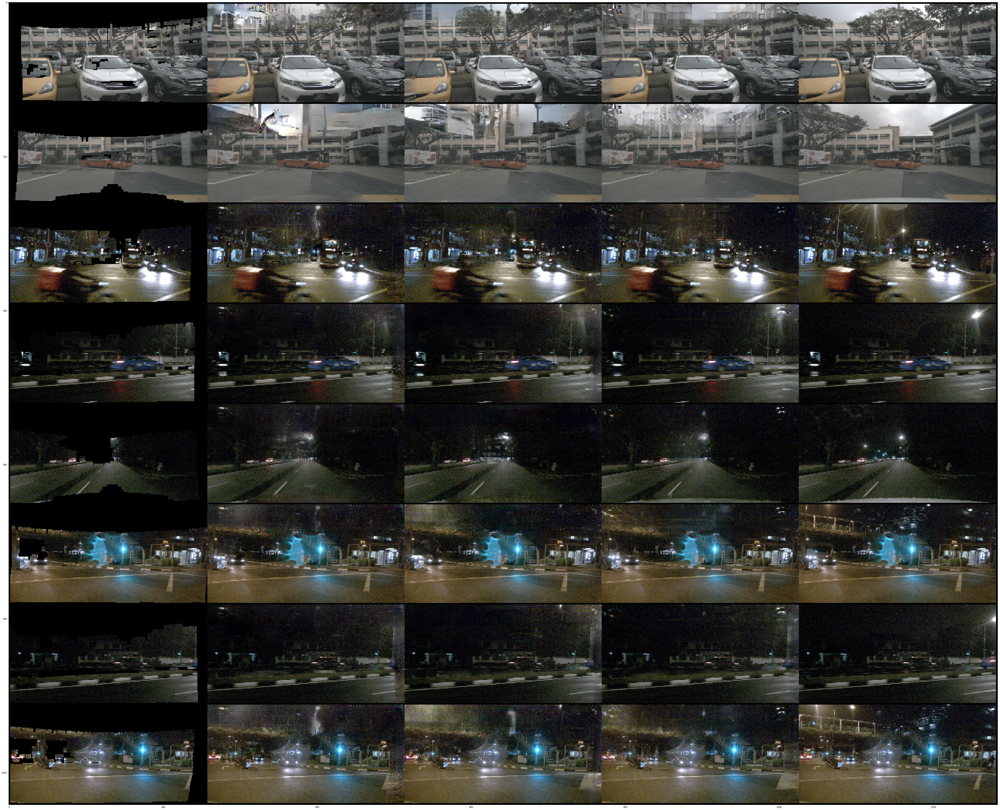

In [5]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


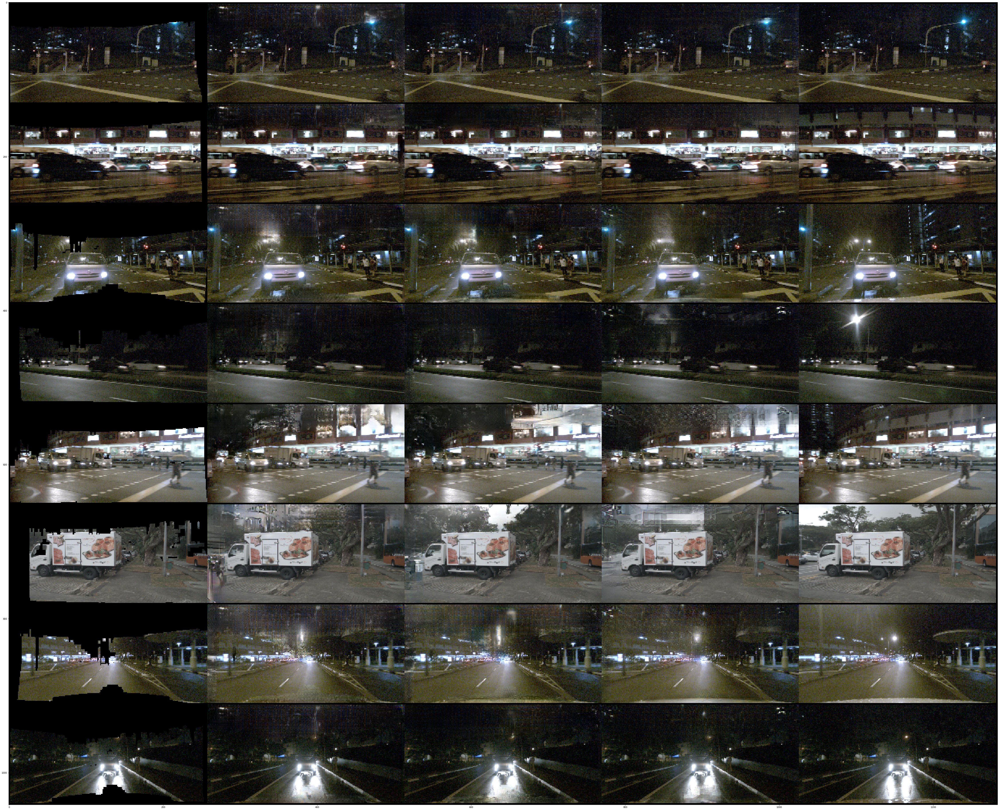

In [20]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


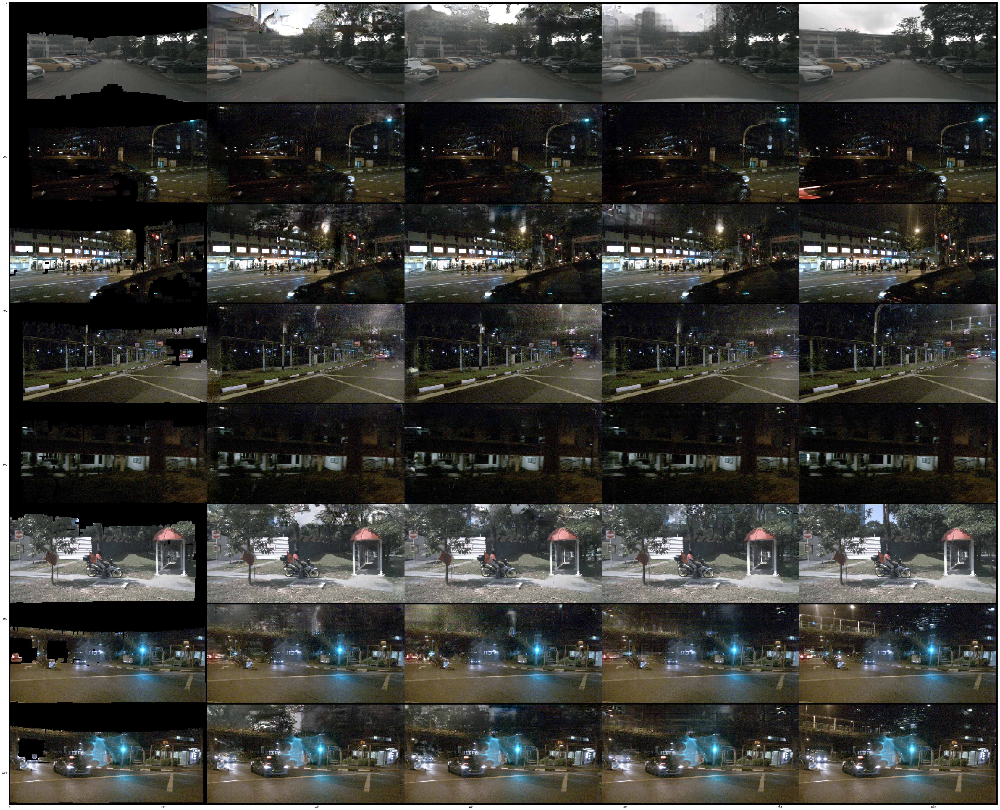

In [21]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


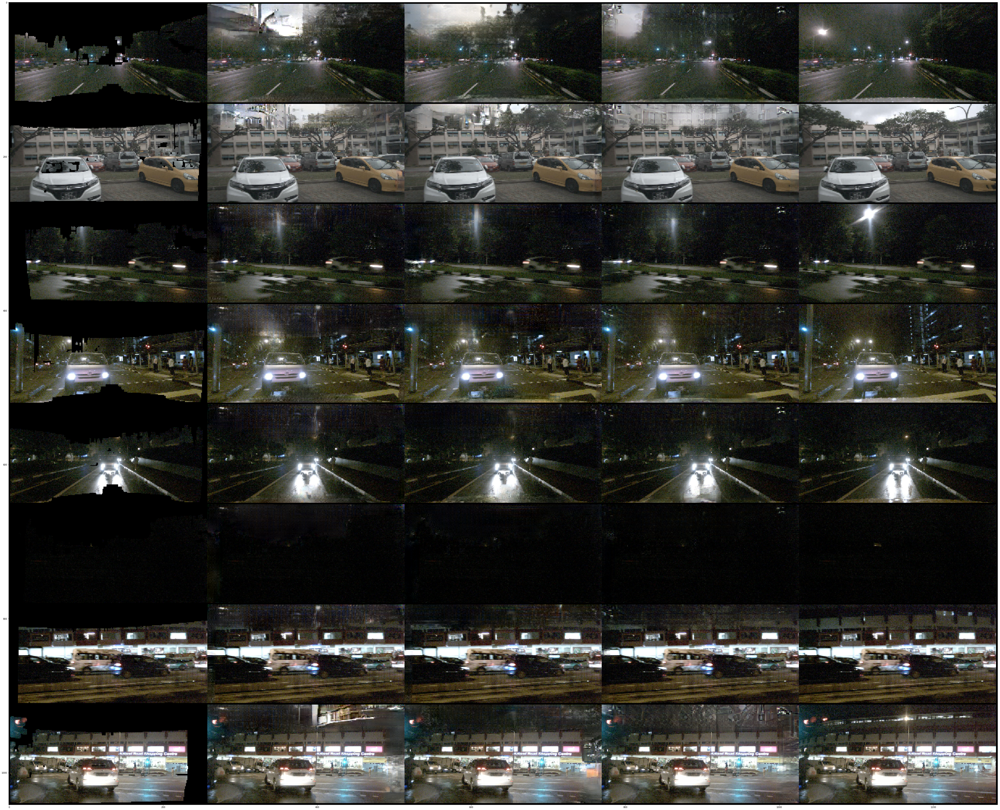

In [22]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


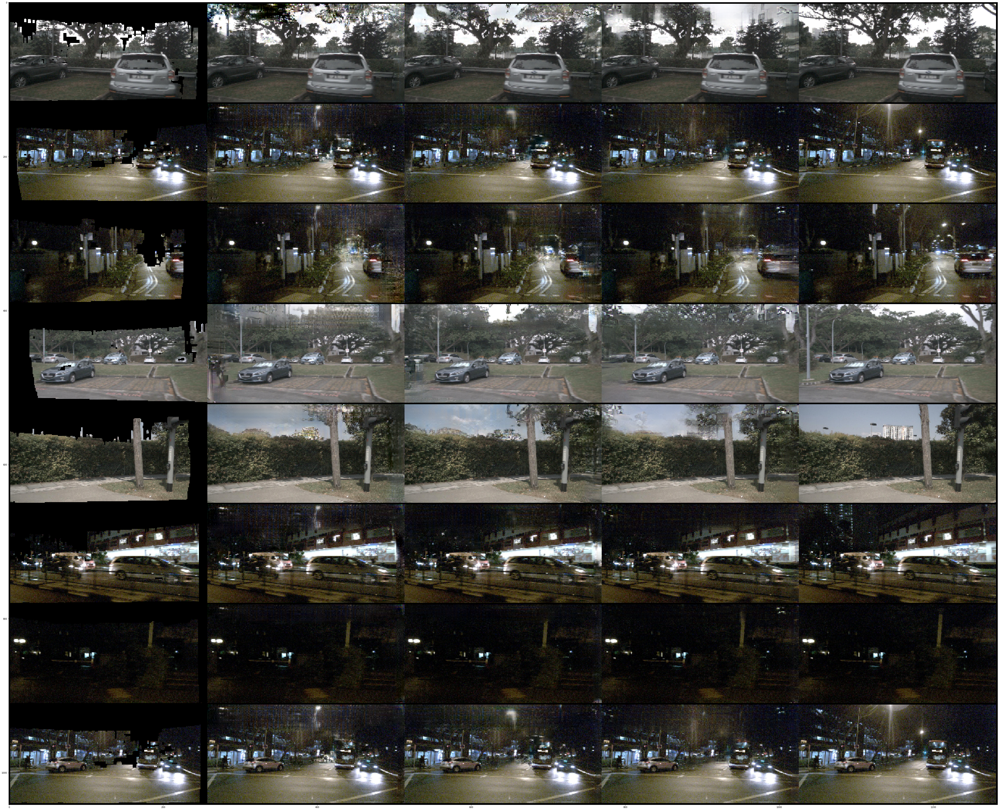

In [23]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


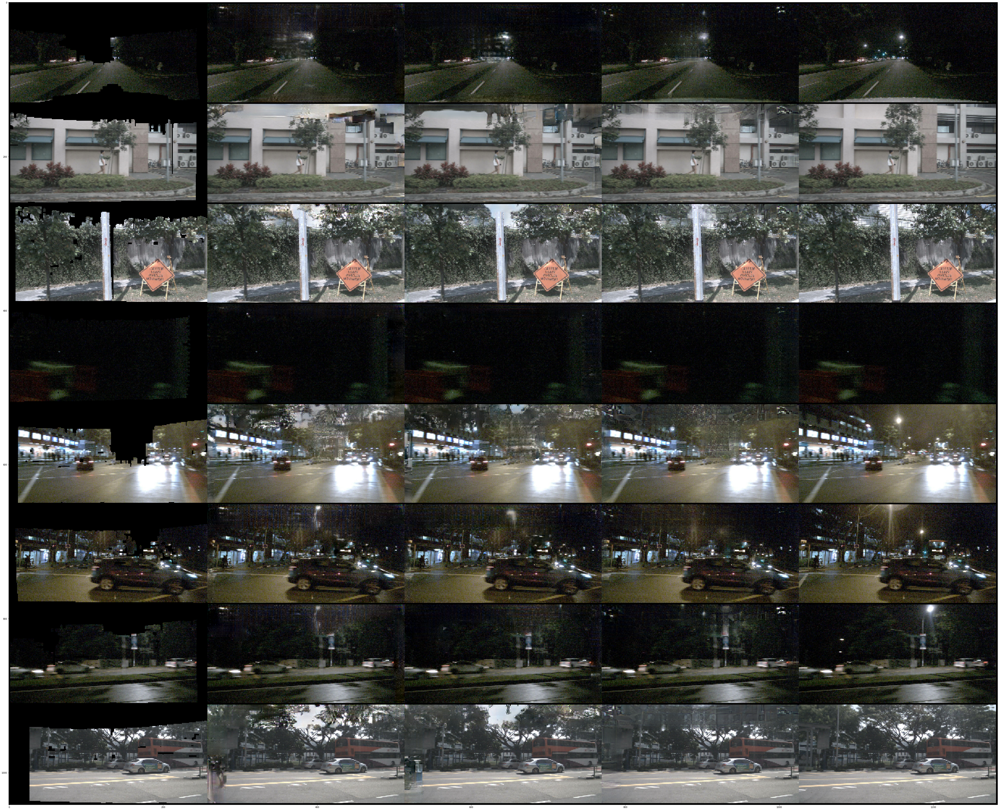

In [24]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


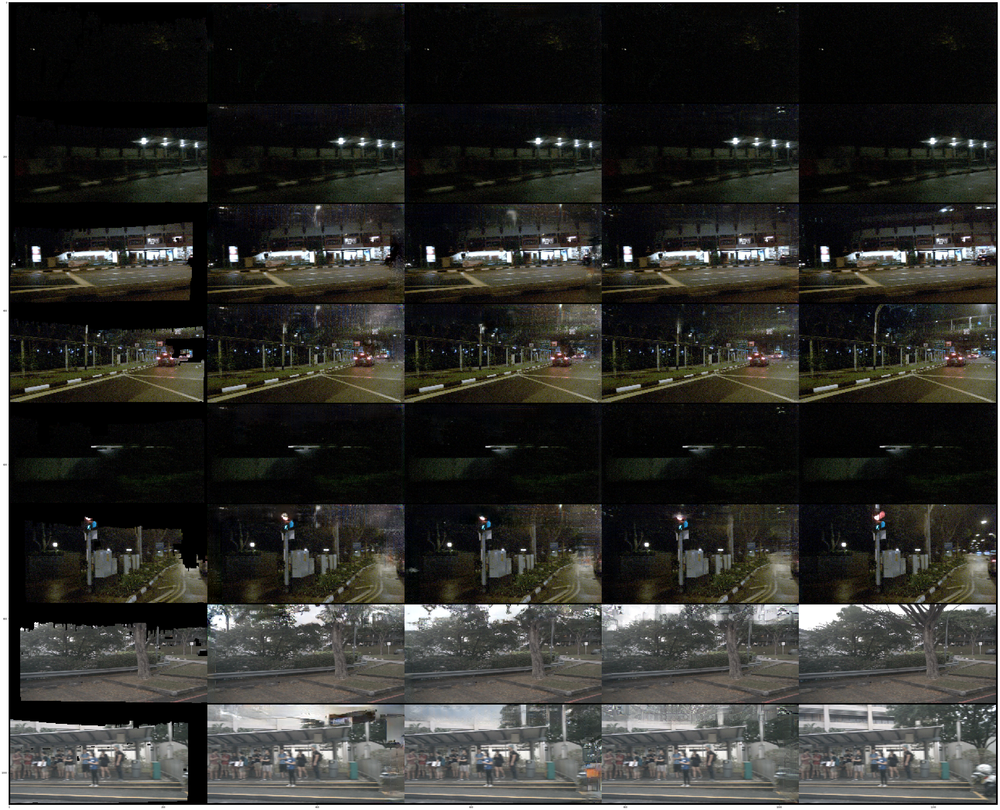

In [25]:
test()

In [ ]:
test()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [ ]:
test()

In [ ]:
test()

In [ ]:
test()